In [176]:
import os
import json
import time
import zipfile
import calendar
import datetime
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
from ast import literal_eval
from collections import Counter

from IPython.display import HTML
from matplotlib import pyplot as plt
from matplotlib import animation
from matplotlib.ticker import FormatStrFormatter
from sklearn.cluster import KMeans
%matplotlib inline

from spotify_unwrapped import load_streaming_history

warnings.filterwarnings("ignore", category=FutureWarning)
sns.set_style("white")
plt.rcParams["figure.figsize"] = (20,5)

spotify_hex_green = '#1DB954'
spotify_hex_black = '#191414'
spotify_rgb_green = [30/256, 215/256, 96/256]
spotify_rgb_black = [25/256, 20/256, 20/256]

In [177]:
import plotly.express as px

# Data read and process

In [178]:
df_full_cols = ['track_id', 'endTime', 'ms_played', 'conn_country', 'trackName', 'artistName', 'albumName', 'spotify_track_uri', 'reason_start', 'reason_end', 'shuffle', 'skipped', ]
df_full = load_streaming_history()[df_full_cols]

mdf_cols = ['id', 'popularity']
mdf = pd.read_csv('../data/track_metadata.csv', index_col=[0])[mdf_cols]

artist_df_cols = ['id', 'genres','popularity','followers',]
artist_df = pd.read_csv('../data/artist_metadata.csv', index_col=[0])[artist_df_cols].dropna()

artist_df.genres = artist_df.genres.apply(literal_eval)

2024-12-11 15:22:52:INFO: Trying to load /Users/conor/work/conchobhar/spotify-unwrapped/data/my_spotify_data_extended.zip
2024-12-11 15:22:54:INFO: Dropping 7499 duplicates by 'endTime' field...


In [179]:
# afdf_cols = ['id', 'danceability','energy','key','loudness','mode','speechiness','acousticness','instrumentalness','liveness','valence','tempo',]
# afdf = pd.read_csv('../data/audio_features.csv', index_col=[0])[afdf_cols]

In [180]:
df_full.shape, mdf.shape, artist_df.shape

((89352, 12), (44209, 2), (10082, 4))

In [181]:
df_full.endTime = pd.to_datetime(df_full.endTime)

In [182]:
df = (df_full
       .merge(mdf,  how='left', left_on='track_id', right_index = True)
       # .merge(afdf, how='left', left_on='track_id', right_on='id')
       .merge(artist_df['genres'], how='left', left_on='artistName', right_index=True)
       .set_index('endTime').sort_index())

In [183]:
# If one of the audio_features is NA, they all are
print("Dropping genre NAs", df.isna()['genres'].sum())
df = df.dropna(subset=['genres'])

Dropping genre NAs 2150


In [184]:
# Useful
df['artistTrackConcat'] = df.artistName + ' - ' + df.trackName

# Can also use calendar.day_name, calendar.month_name
df['day_name'] = df.index.day_name()
day_name_categories = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df['month_name'] = df.index.month_name()
month_name_categories =  ['January','February','March','April','May','June','July','August','September','October','November','December']

`df` is the main DataFrame used from here on

`tdf` is a temporary DataFrame and not expected to be used across (many) cells

# General

In [185]:
df[df.popularity == 0 ].index.year.value_counts()

endTime
2016    8713
2017    4824
2020    4334
2018    4081
2021    3950
2019    3650
2022    2746
2023     720
Name: count, dtype: int64

<Axes: xlabel='popularity'>

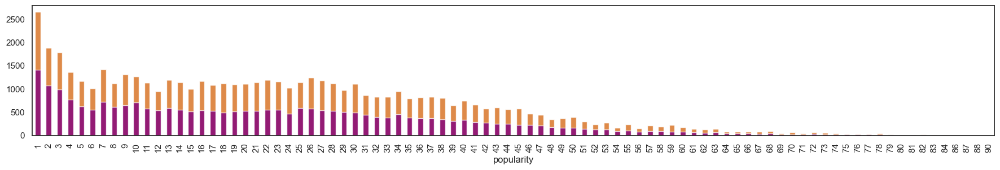

In [186]:
# Track 'popularity' distribution - as raw counts or listens & only considering each track once
# Popularity changes over time, so this snapshot doesn't capture the popularity at time of listen - Tracks tend to sink to zero
tdf = df[df.popularity >= 1]
tdf.popularity.dropna().value_counts().sort_index().plot(kind='bar', color='#d66d1c', alpha=0.8)
# De-duplicate tracks to remove listen bias
# df[df.popularity == 28].trackName.value_counts().head(6)
tdf.drop_duplicates(subset=['artistName','trackName']).popularity.dropna().value_counts().sort_index().plot(kind='bar', color='purple', figsize=(22,3), alpha=0.8)
# ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))

In [276]:
def ridge_plot(tdf, x, y, bw_adjust=0.4,hspace=-0.6,label_text_y=0.2, alpha=1, palette='flare',xlim=None, xlabel=None, clip=None, filename=None, figure_facecolor='white', pulsar=False):
    kde_shape_color = None
    kde_curve_color = 'white'
    linewidth=1.5
    if pulsar:
        sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
        figure_facecolor='black'
        kde_shape_color='black'
        kde_curve_color='white'
        linewidth=2.5
    # Initialize the FacetGrid object
    g = sns.FacetGrid(data=tdf, row=y, hue=y, aspect=24, height=0.7, palette=palette, xlim=xlim)
    g.figure.set_facecolor(figure_facecolor)

    # Draw the densities in a few steps
    g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=False, color=kde_shape_color, fill=True, alpha=alpha, linewidth=linewidth, clip=clip)
    g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=False, color=kde_curve_color, lw=2, clip=clip)
    if not pulsar:
        g.refline(y=0, linewidth=2.5, linestyle="-", color=kde_shape_color, clip_on=False)  # passing color=None to refline() uses the hue mapping

    # Store pulsar theme in kwargs dict - if not enabled, we should use the default
    kwargs = {'backgroundcolor':'white'} if pulsar else {}
    # Define and use a simple function to label the plot in axes coordinates
    def label(x, color, label):
        ax = plt.gca()
        if pulsar:
            color='black'
        ax.text(0, label_text_y, label, fontsize=20, fontweight="bold", color=color, ha="left", va="center", transform=ax.transAxes, **kwargs)

    g.map(label, x)
    g.figure.subplots_adjust(hspace=hspace)  # Set the subplots to overlap
    # Remove axes details that don't play well with overlap
    g.set_titles('')
    g.set(yticks=[], ylabel="")
    last_color = 'white' if pulsar else sns.color_palette("flare", as_cmap=False)[-1]
    g.set_xticklabels(weight='bold', fontsize=24, color=last_color) # setting these params disrupts the default xticklabel range - not sure how to fix
    g.set_xlabels(xlabel, weight='bold', fontsize=16, color=last_color)
    bbox_inches='tight'
    g.despine(bottom=True, left=True)
    if filename:
        plt.savefig(f'../output/{filename}')
    sns.set_theme(style="white")  # Set theme back for later plots

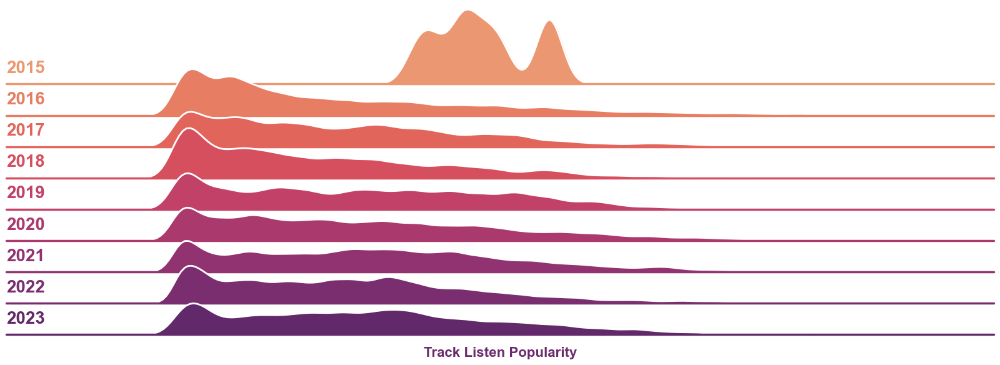

In [277]:
# Does popularity drift further left due to the age of listens?
tdf = df[df.popularity >= 1].drop_duplicates(subset=['artistName','trackName']).copy()
tdf['year'] = tdf.index.year
tdf['date'] = tdf.index.round('1d')
# sns.kdeplot(x=tdf.popularity, hue=tdf.index.year, warn_singular=False)
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
y = 'year' 
x = 'popularity'
ridge_plot(tdf, x, y, xlabel="Track Listen Popularity")

In [13]:
tdf = df#[query]
xticks = [datetime.time(x,0) for x in range(24)]
ds = tdf.groupby(pd.Grouper(freq="D")).size().rolling(28, center=True, min_periods=1).mean()
# _.plot(color=spotify_rgb_green, linewidth=2.5)
fig = px.line(x=ds.index, y=ds.values, title="Track Listen Count")
# ds = tdf.groupby(pd.Grouper(freq="D")).size().rolling(7, center=True, min_periods=1).mean()
# fig = px.line(x=ds.index, y=ds.values, title="Track Listen Count")

fig.update_layout(
    showlegend=False,
    plot_bgcolor="white",
)
fig.update_yaxes(visible=False, fixedrange=False)
fig.update_xaxes(visible=True, fixedrange=False)
fig.update_layout(annotations=[], overwrite=True, xaxis_title="")
fig.update_layout(font=dict(family="Arial",size=12, color=spotify_hex_black))
fig.update_traces(line_color=spotify_hex_green)
fig.show()

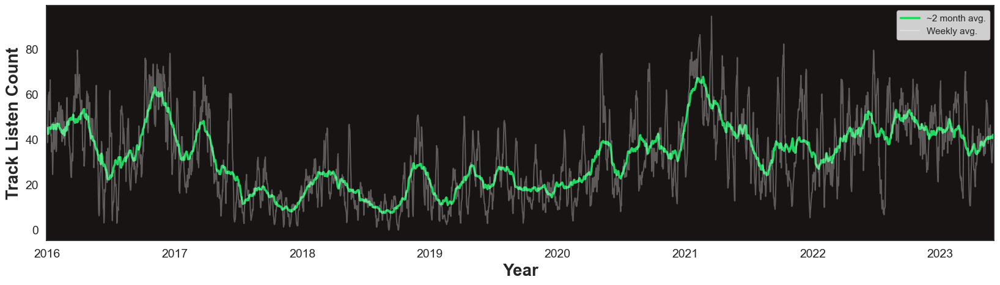

In [14]:
# Listen count trends over time
# query = (df.artistName == "Musician's Practice Partner") # & (df.index > pd.to_datetime('2020-11-01')) & (df.index < pd.to_datetime('2021-02-01'))
tdf = df#[query]
xticks = [datetime.time(x,0) for x in range(24)]
_ = tdf.groupby(pd.Grouper(freq="D")).size().rolling(56, center=True, min_periods=1).mean()
_.plot(color=spotify_rgb_green, linewidth=2.5)
_ = tdf.groupby(pd.Grouper(freq="D")).size().rolling(7, center=True, min_periods=1).mean()
ax = _.plot(alpha=0.3, xlabel='Date', color='white',fontsize=14)
al = ax.legend(['~2 month avg.', 'Weekly avg.'])
ax.set_facecolor(spotify_rgb_black)
ax.set_ylabel('Track Listen Count', fontsize=20, weight='bold')
ax.set_xlabel('Year', fontsize=20, weight='bold')
ax.figure.savefig('../output/listening_history.png')

# Audio Features (No longer available with API)
https://developer.spotify.com/discover/#audio-features-analysis

- Mood: Danceability, Valence, Energy, Tempo
- Properties: Loudness, Speechiness, Instrumentalness
- Context: Liveness, Acousticness

In [378]:
# Feature auto correlation
corr = df.drop_duplicates(subset=['artistName','trackName'])[afdf_cols[1::]].corr()
sns.heatmap(corr, annot=True, cmap='OrRd', fmt='.2f', mask=np.triu(corr))

NameError: name 'afdf_cols' is not defined

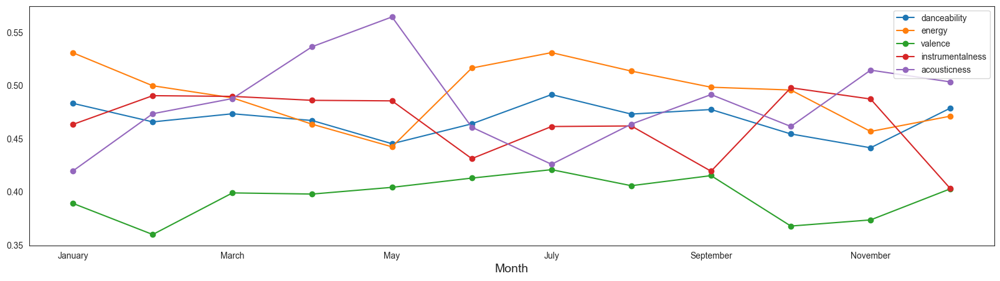

In [ ]:
# Audio features over the months
features=['danceability', 'energy', 'valence', 'instrumentalness', 'acousticness']
for feature in features:
    ax = df.groupby('month_name')[feature].mean()[month_name_categories].plot(marker='o')
    ax.legend(features)
_ = ax.set_xlabel('Month', fontsize=14)

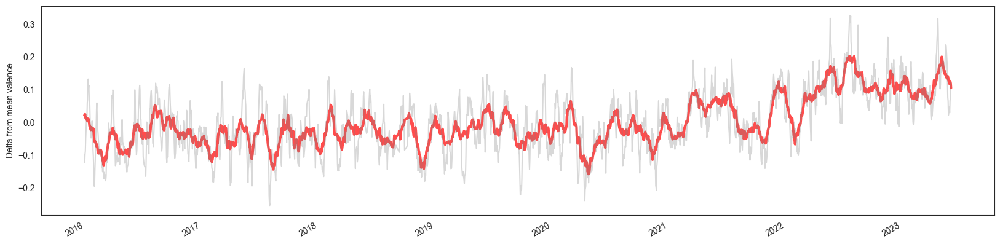

In [ ]:
# Valence over time - High valence should represent positive mood, and low valence a negative mood
audio_feature = 'valence'
tdf = df
_ = tdf.groupby(pd.Grouper(freq="1D"))[audio_feature].mean().dropna().rolling(30, center=True, min_periods=1).mean()
ax = (_ - _.mean()).plot(color='red', alpha=0.7, linewidth=3)
_ = tdf.groupby(pd.Grouper(freq="1D"))[audio_feature].mean().dropna().rolling(7, center=True, min_periods=1).mean()
ax = (_ - _.mean()).plot(color='grey', alpha=0.3)
_ = ax.set_xlabel('')
_ = ax.set_ylabel(f'Delta from mean {audio_feature}')

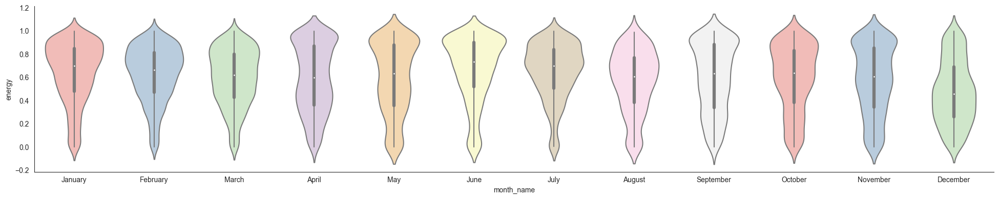

In [ ]:
# Audio feature distribution by day/month - trends over several years
tdf = df[df.index.year == 2021]
sns.catplot(data=tdf, kind="violin", x="month_name", y="energy", split=True, palette='Pastel1', height=4, aspect=4.9)

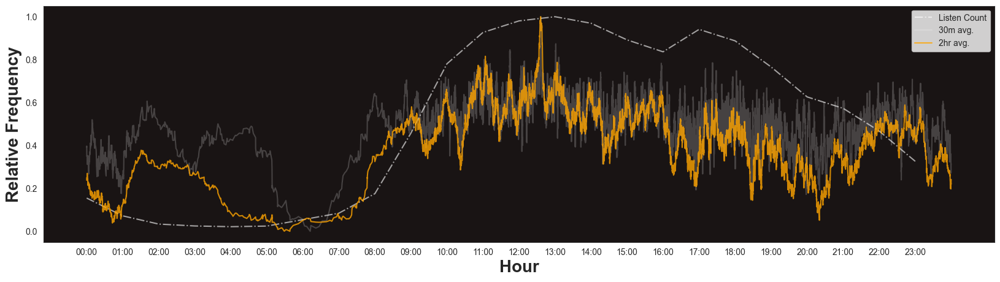

In [16]:
# Feature over a day - with listen volume for reference
# The most dramatic varience is due to the low observation count
# Need a 6hr rolling average to smooth out the noise - not clear if there are any meaningful trends 
tdf = df[df.index.year == 2021]

xticks = [datetime.time(x,0) for x in range(24)]
# Get obs. volume (listen count) per hour
_ = df.groupby(pd.Grouper(freq="1H")).size()
_ = _.groupby(_.index.hour).sum()
_.index = _.index.map(lambda x: datetime.time(x,0))
_ = _/_.max()
_.plot( xticks=xticks, color='white', alpha=0.6, ls='-.')

# cols = ['valence', ]
# for col in cols:
# Get mean feature rolling avg. over hr
col = 'energy'
_ = tdf.groupby(tdf.index.time)[col].mean()
_ = _.rolling(30*1, center=True, min_periods=1).mean()
# Scale values between 0-1
_ = _ - _.min()
_ = _/_.max()
_.plot(color='white', alpha=0.2)

# and again for 6 hour to represent variation
_ = tdf.groupby(tdf.index.time)[col].mean()
_ = _.rolling(60*2, center=True, min_periods=1).mean()
# Scale values between 0-1
_ = _ - _.min()
_ = _/_.max()
ax = _.plot(color='orange', alpha=0.8)

ax.legend(['Listen Count','30m avg.', '2hr avg.'])
_  = ax.set_xlabel("")
ax.set_facecolor(spotify_rgb_black)
ax.set_ylabel('Relative Frequency', fontsize=20, weight='bold')
ax.set_xlabel('Hour', fontsize=20, weight='bold')
ax.figure.savefig('../output/listening_history_24hr.png')

# Clustering
We can aggregate across different properties to get a higher view of patterns in the history

## Genre
Genres are applied at the artist level. Each artist can have zero or more genres applied to them. We can associate each track listen with the genre(s) of the tracks artist.

Since the number of distinct genres is very granular, we should look to find ways to group them together.

In [15]:
df.groupby(pd.Grouper(freq='1w'))['genres'].sum()['2021-12-05'][0:4]

['jazz guitar', 'modern jazz trio', 'ecm-style jazz', 'jazz piano']

In [16]:
# Aggregate to week level and collect genres as counts of plays that week
dfg = df.groupby(pd.Grouper(freq='1w'))['genres'].apply(lambda x:sum(x, start=[])).apply(lambda x: pd.Series(Counter(x), dtype=object)).fillna(0).astype(int)
# Get genre labels for later
_ = dfg.sum().sort_values(ascending=False)
genres_by_popularity = _.index.to_list()
topn=20
topn_genres = genres_by_popularity[0:topn]

dfg.head(2)

,cyberpunk,synthwave,spacewave,classic dubstep,electronica,future garage,hauntology,intelligent dance music,trip hop,uk bass,wonky,indie rock,lo-fi,noise pop,olympia wa indie,shoegaze,slacker rock,darksynth,breton folk,celtic,anti-folk,chamber pop,folk punk,melancholia,new weird america,modern rock,philly indie,instrumental rock,neo classical metal,shred,abstract,ambient,drone,nordic ambient,sound art,chill lounge,deep chill,nu jazz,ambient psychill,ambient trance,...,canadian indigenous hip hop,ottawa rap,japanese indie pop,shibuya-kei,japanese post-punk,comfy synth,japanese new wave,techno kayo,japanese indie folk,molam,calgary indie,mbira,chinese indie rock,chinese post-punk,hardwave,gypsy fusion,vocal ensemble,denver indie,varmland rock,chicha,irish ballad,idol rock,musique peule,greek indie,flemish folk,native american contemporary,argentine rock,pop argentino,reggae rock,london rap,aussie drill,panpipe,christian hip hop,uk christian rap,pygmy music,texasgaze,manguebeat,samba-rock,tropicalia,children's music
endTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-03 00:00:00+00:00,30,63,16,7,7,7,7,7,7,7,7,38,37,12,12,12,12,10,6,6,25,26,25,25,25,1,1,11,11,11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2016-01-10 00:00:00+00:00,0,68,15,0,32,0,0,74,0,0,0,22,5,0,0,0,0,0,0,0,5,22,5,22,5,0,0,45,20,45,67,44,42,42,42,41,41,41,2,2,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


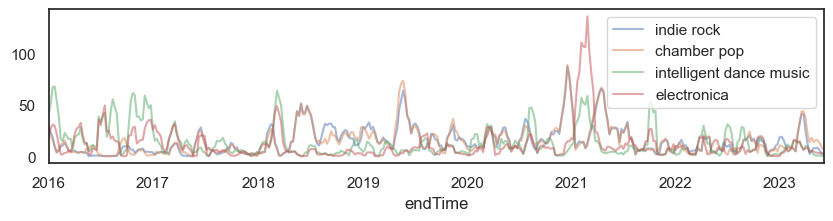

In [17]:
# Common genres will be highly correlated since they are grouped together for artists
ax = dfg[topn_genres[0:4]].rolling(4,  center=True, min_periods=1).mean().plot(alpha=0.5, figsize=(10,2))

In [18]:
# Collect groups of genres by association through genre collections
def get_genres_by_association(genre: str, topn=20) -> list[str]:
    """For a given genre, get the collections of genres it is found with, calculate
    value counts over all collections for each genre and return the top N by occurance."""
    if genre not in genres_by_popularity:
        print(f"WARNING: genre {genre} not found.")
        return list()
    df_genres = df[df.genres.apply(lambda x:genre in x)].genres
    top_genres = df_genres.explode().value_counts().iloc[0:min(topn, len(df_genres))].index
    return list(set(top_genres))


genres_edm = get_genres_by_association('edm')
genres_folk  = get_genres_by_association('irish folk')

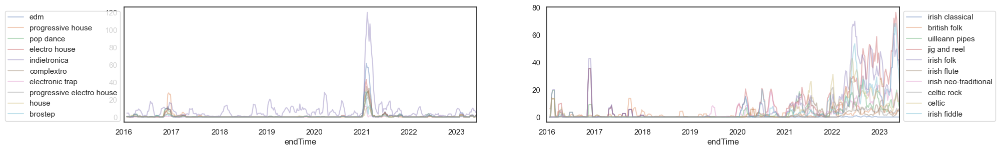

In [19]:
# Difficult to resolve much given how  granular the genres are, but this gives an idea of activity spikes
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(20,3))
ax = dfg[get_genres_by_association('edm', topn=10)].rolling(4).mean().plot(alpha=0.4, ax = axes[0])
ax.legend(bbox_to_anchor=(0, 1))
ax = dfg[get_genres_by_association('irish folk', topn=10)].rolling(4).mean().plot(alpha=0.4, ax = axes[1])
ax.legend(bbox_to_anchor=(1, 1))

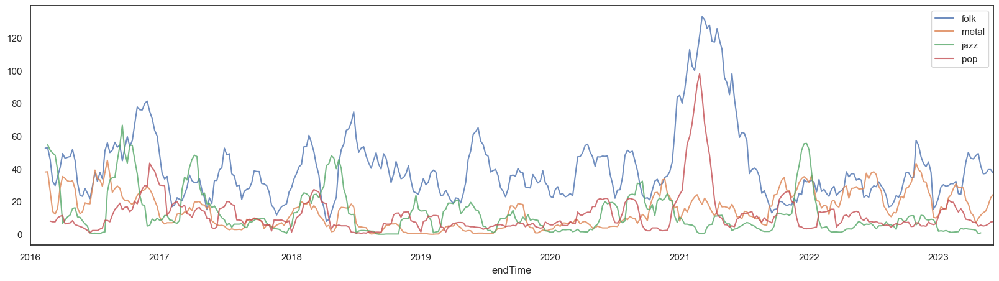

In [20]:
# Get genres for a few groups - plot counts for artists that contain any of those genres
genre_groups = ['folk', 'metal', 'jazz', 'pop']
for genre in genre_groups:
    genres = get_genres_by_association(genre)
    ax = df[df.genres.apply(lambda x: any([g in x for g in genres]))].groupby(pd.Grouper(freq='1w')).size().rolling(7).mean().plot(alpha=0.8)

ax.legend(genre_groups, bbox_to_anchor=(1, 1))

## Embedding Genre Vectors

In [21]:
from gensim.models import Word2Vec, LdaModel
from gensim.corpora.dictionary import Dictionary

import itertools
import random
import copy

In [22]:
genres_collections = df.drop_duplicates(['artistName','trackName']).genres.values

<Axes: xlabel='genres'>

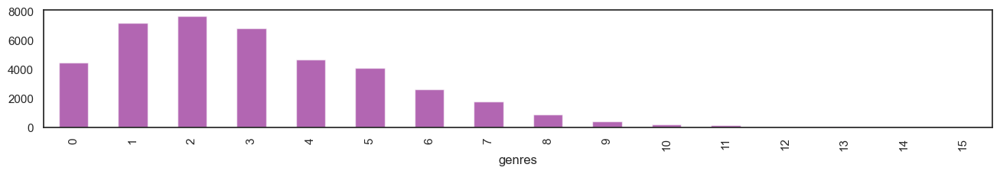

In [23]:
# A lot of genre-less results, maybe due to issues with search request made or else some artists just don't get genres
df.drop_duplicates(['artistName','trackName']).genres.apply(len).value_counts().sort_index().plot(kind='bar', color='purple', alpha=0.6, figsize=(16,2))

In [24]:
df.drop_duplicates(['artistName','trackName'])[df.drop_duplicates(['artistName','trackName']).genres.apply(len) == 0].sample(5)

,track_id,ms_played,conn_country,trackName,artistName,albumName,spotify_track_uri,reason_start,reason_end,shuffle,skipped,id,popularity,genres,artistTrackConcat,day_name,month_name
endTime,,,,,,,,,,,,,,,,,
2018-05-20 19:38:48+00:00,1sZOBUGiY5gXLaSo17Jnxj,65546,GB,Nap Hangs up the Phone,John Swihart,Napoleon Dynamite (Original Motion Picture Sou...,spotify:track:1sZOBUGiY5gXLaSo17Jnxj,trackdone,trackdone,False,NaN,1sZOBUGiY5gXLaSo17Jnxj,19,[],John Swihart - Nap Hangs up the Phone,Sunday,May
2022-03-20 14:00:01+00:00,0HnJudOldms51Xlzn4XALJ,170675,GB,Mystery Card,Harald Revery,Mystery Card,spotify:track:0HnJudOldms51Xlzn4XALJ,trackdone,trackdone,False,NaN,0HnJudOldms51Xlzn4XALJ,23,[],Harald Revery - Mystery Card,Sunday,March
2016-12-16 00:05:13+00:00,3sA1QxjVNh7GiH8rpTLKdL,251350,GB,Front to Back,Buku,Front to Back,spotify:track:3sA1QxjVNh7GiH8rpTLKdL,trackdone,trackdone,False,0.0,3sA1QxjVNh7GiH8rpTLKdL,0,[],Buku - Front to Back,Friday,December
2017-06-09 20:54:09+00:00,5W7Wx2MkAPrnlMO9OARpXN,136688,GB,"Nocturnes: No. 1 in F Minor, Op. 55",Denise Schopenhauer,Classical Studying Music for Focus & Concentra...,spotify:track:5W7Wx2MkAPrnlMO9OARpXN,trackdone,trackdone,False,0.0,5W7Wx2MkAPrnlMO9OARpXN,7,[],Denise Schopenhauer - Nocturnes: No. 1 in F Mi...,Friday,June
2016-05-03 16:43:02+00:00,4aiIno3l6XZILE50vCZfZb,135157,GB,"Pulsars, Pt. 2: Episode 7",Tomasz Trzcinski,"Piano Exploration, Vol. 7: Pulsars, Moonshadow...",spotify:track:4aiIno3l6XZILE50vCZfZb,trackdone,trackdone,False,NaN,4aiIno3l6XZILE50vCZfZb,8,[],"Tomasz Trzcinski - Pulsars, Pt. 2: Episode 7",Tuesday,May


In [25]:
t0 = time.time()
genre2vec = Word2Vec(sentences=genres_collections, vector_size=16, window=18, min_count=1, workers=1, epochs=2**4)
print(f"Time taken {(time.time() - t0):.2f}s")

2024-12-11 13:15:45:INFO: collecting all words and their counts
2024-12-11 13:15:45:INFO: PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2024-12-11 13:15:45:INFO: PROGRESS: at sentence #10000, processed 33471 words, keeping 1287 word types
2024-12-11 13:15:45:INFO: PROGRESS: at sentence #20000, processed 67990 words, keeping 1856 word types
2024-12-11 13:15:45:INFO: PROGRESS: at sentence #30000, processed 98527 words, keeping 2346 word types
2024-12-11 13:15:45:INFO: PROGRESS: at sentence #40000, processed 124229 words, keeping 2785 word types
2024-12-11 13:15:45:INFO: collected 2833 word types from a corpus of 127397 raw words and 41377 sentences
2024-12-11 13:15:45:INFO: Creating a fresh vocabulary
2024-12-11 13:15:45:INFO: Word2Vec lifecycle event {'msg': 'effective_min_count=1 retains 2833 unique words (100.00% of original 2833, drops 0)', 'datetime': '2024-12-11T13:15:45.930780', 'gensim': '4.3.2', 'python': '3.11.3 (main, May 15 2023, 18:01:31) [Clang 14.0.6 ]'

Time taken 1.54s


In [26]:
genre2vec.wv.similar_by_word('irish folk', topn=5)

[('irish neo-traditional', 0.9315219521522522),
 ('operatic pop', 0.9237491488456726),
 ('gregorian dance', 0.9082837700843811),
 ('breton folk', 0.9060508608818054),
 ('irish gaelic folk', 0.9045489430427551)]

In [27]:
t0 = time.time()
kmeans_genres = KMeans(n_clusters=30, n_init=100, max_iter=300).fit(genre2vec.wv.vectors)
print(f"Time taken {(time.time() - t0):.2f}s")

Time taken 4.54s


In [24]:
# [g for g in genres_by_popularity if 'rock' in g]

In [28]:
import matplotlib.cm as cm
from sklearn.manifold import TSNE
# TNSE kwargs
# Bouquet shape (2/3d)
# TSNE(perplexity=11, n_components=2, init='pca', n_iter=2**8, random_state=7, learning_rate='auto')
tsne_2d = TSNE(perplexity=11, n_components=2, init='pca', n_iter=2**8, random_state=7, learning_rate='auto')
genre_tsne_2d = tsne_2d.fit_transform(genre2vec.wv.vectors)


# color and alpha related to genre counts from listens
# scaling exponent is picked to produced desired aesthetic
#   care more that low counts should be a transparent single color
#   higher counts should stick out
dfg_counts = dfg.sum()[genre2vec.wv.key_to_index.keys()]
colors = dfg_counts**0.3
colors = (colors/(colors.max()))
alphas = dfg_counts**0.3
alphas = (alphas/(alphas.max()))
# linewidths = [(10 if g in display_genres else 0) for g, a in alphas.items()]

# # Get some random genres to display
# display_genres = copy.copy(genres_by_popularity[0:2000])
# random.shuffle(display_genres)

# # Or explicit
display_genres = ['modular synth','dark trap','japanese r&b','christian power metal', 'twee pop','southeast asian post-rock','west end','balearic','jangle pop','russian folk rock','swamp rock',
                  'appalachian folk','arabic jazz','atmosphere','drill','anglican liturgy','crunk','munich electronic','destroy techno', 'jig and reel', 'pagan black metal']

In [29]:
def tsne_plot_2d(vectors, key2vectors, key_annotations=[], colors=None, alphas=1, cmap='husl', annotate_size=14, filename=None):
    plt.figure(figsize=(16, 9))
    x = vectors[:,0]
    y = vectors[:,1]
    plt.scatter(x, y, c=colors, alpha=alphas, cmap=cmap)
    for i, key in enumerate(key_annotations):
        gidx = key2vectors[key]
        plt.annotate(key, alpha=0.95, xy=(x[gidx], y[gidx]), xytext=(5, 2),
                     textcoords='offset points', ha='right', va='bottom', size=annotate_size, weight='bold')
    plt.grid(True)
    if filename:
        print('saving')
        plt.savefig(f'../output/{filename}')
    plt.show()

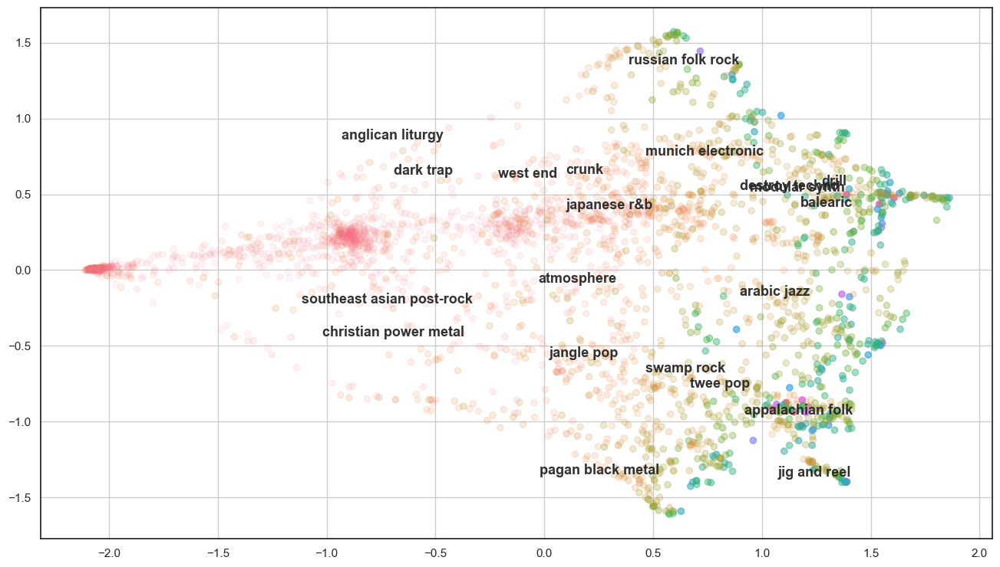

In [30]:
# Colour by value counts to highlight frequent genres
cmap_husl_kmeans = sns.color_palette("husl", kmeans_genres.n_clusters, as_cmap=True)
_ = tsne_plot_2d(genre_tsne_2d, genre2vec.wv.key_to_index, key_annotations=display_genres, colors=colors, alphas=alphas, cmap=cmap_husl_kmeans, annotate_size=13)

saving


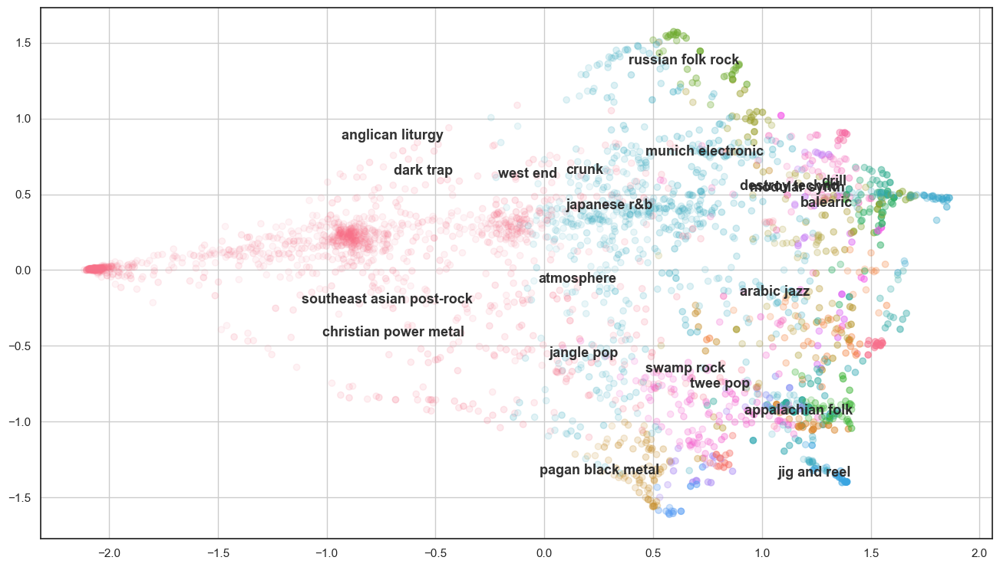

In [32]:
# Color by clustering
kmeans_genre_clusters = kmeans_genres.predict(genre2vec.wv.vectors)
cmap_husl_kmeans = sns.color_palette("husl", kmeans_genres.n_clusters, as_cmap=True)
_ = tsne_plot_2d(genre_tsne_2d, genre2vec.wv.key_to_index, key_annotations=display_genres, colors=kmeans_genre_clusters, alphas=alphas, cmap=cmap_husl_kmeans, annotate_size=13, filename='genre_tsne_2d_kmeans.png')

2024-12-11 13:17:06:INFO: Animation.save using <class 'matplotlib.animation.PillowWriter'>


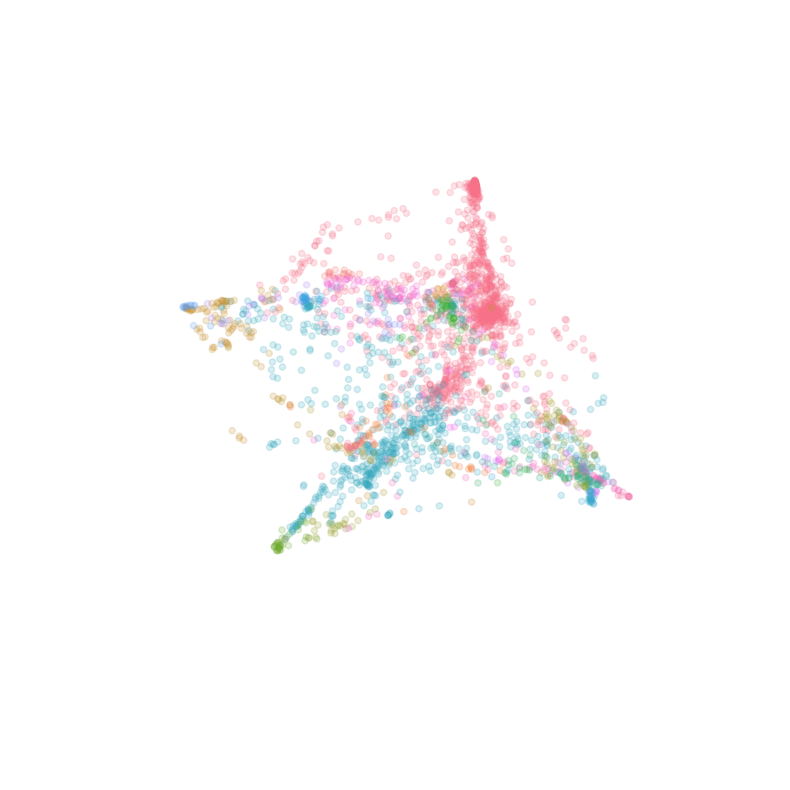

In [33]:
# In 3D - set `%matplotlib inline` for interactive vis.
tsne_wp_3d = TSNE(perplexity=11, n_components=3, init='pca', n_iter=2**8, random_state=7)
genre_tsne_3d = tsne_wp_3d.fit_transform(genre2vec.wv.vectors)


def tsne_plot_3d(vectors, colors=None, alphas=0.2, cmap='nipy_spectral', gif_filename=None):
    fig = plt.figure(frameon=False, figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')
    # ax = plt.Axes(fig, [0, 0, .75, .75])
    # fig.add_axes(ax)
    # ax.set_axis_off()
    x, y, z = vectors[:, 0], vectors[:, 1], vectors[:, 2]
    cax = ax.scatter(x, y, z, c=colors, cmap=cmap, alpha=alphas)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.grid(visible=False)
    def rotate(angle):
        ax.view_init(elev=15, azim=angle)
    if gif_filename:
        ax.set_axis_off()
        ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, 1), interval=1)
        ani.save(f'../output/{gif_filename}', writer=animation.PillowWriter(fps=30))
    plt.show()

    
tsne_plot_3d(genre_tsne_3d, colors=kmeans_genre_clusters, cmap=cmap_husl_kmeans, gif_filename='genre_tsne_3d_kmeans.gif')

In [34]:
# combine genre_tsne_3d with kmeans_genre_clusters
df_3dvec = pd.DataFrame(genre_tsne_3d, columns=['x','y','z'])
df_3dvec['cluster'] = kmeans_genre_clusters
df_3dvec['genre'] = genre2vec.wv.key_to_index.keys()


In [35]:
df_3dvec.head()

,x,y,z,cluster,genre
0,1.129899,0.191733,-0.670900,11,compositional ambient
1,1.254850,0.639993,-0.606332,11,intelligent dance music
2,1.176406,0.699102,-0.534012,8,electronica
3,0.288326,-0.802052,-1.359535,9,classical
4,1.161840,0.008307,0.612658,14,indie rock


In [36]:
df_3dvec.to_csv('../df_3dvec.csv', index=False)

In [37]:
kmeans_genre_clusters

array([11, 11,  8, ...,  0,  0,  0], dtype=int32)

In [38]:
df3d = pd.DataFrame(genre_tsne_3d, columns=['x','y','z'])
df3d['genre_id'] = kmeans_genre_clusters

In [1]:
# import plotly.express as px
# fig = plt.figure(frameon=False, figsize=(10, 5))
# fig = px.scatter_3d(df3d, x='x', y='y', z='z', color='genre_id', opacity=0.2, color=cmap_husl_kmeans)
# fig.show()

### We can associate each artist with the mean of their genre embeddings, and map the mean to its nearest cluster

In [39]:
def get_mean_embedding_from_genres(genres, word2vec):
    v = np.ndarray(word2vec.vector_size, dtype='float32')
    vectors = [word2vec.wv[genre] for genre in genres]
    if len(vectors) == 0:
        vectors = [v]
    mean = np.mean(vectors, axis=0)
    return mean
    
    
def predict_single_embedding(embedding):
    return kmeans_genre_clusters.predict(np.array(embedding).reshape(1,-1))

In [40]:
def get_2_distinct_categories(genres_by_count):
    """Get 2 categories to describe a cluster. 
    Take the most common and the second most common which also shares no words with the first.
    """
    first = genres_by_count[0]
    for genre in genres_by_count[1::]:
        second = None
        if all([w not in genre.split() for w in first.split()]):
            second = genre
            break
        if second is None:
            second = genres_by_count[1]

    return first, second

In [41]:
# For each cluster, concat the 2 most common genres for the artists contained in it
def generate_cluster_labels(kmeans):
    cluster_labels = {}
    for c in range(kmeans.n_clusters):
        ancounts = df[df.cluster == c]['artistName'].value_counts()
        artist2genre = df.drop_duplicates('artistName').set_index('artistName').genres
        tdf = ancounts.to_frame().merge(artist2genre, how='left', left_index=True, right_index=True).genres
        cluster_labels[c] = '/'.join(get_2_distinct_categories(tdf.explode().value_counts().index))

    # Same but use artists
    for c in range(kmeans.n_clusters):
        ancounts = df[df.cluster == c]['artistName'].value_counts()
        artist2genre = df.drop_duplicates('artistName').set_index('artistName').genres
        tdf = ancounts.to_frame().merge(artist2genre, how='left', left_index=True, right_index=True).genres
        cluster_labels[c] = '/'.join(get_2_distinct_categories(tdf.explode().value_counts().index))
    return cluster_labels

## Audio Features as vectors

In [52]:
# We can treat audio features like embeddings at the track level
def normalize(x):
    return (x - x.min())/(x.max()-x.min())

audio_features = ['danceability','energy', 'loudness', 'speechiness', 'acousticness','instrumentalness', 'liveness', 'valence', 'tempo']

track_features = df.drop_duplicates(subset=['artistName', 'trackName']).set_index(['artistName', 'trackName'])[audio_features]
for f in track_features:
    track_features[f] = track_features[f].pipe(normalize)

KeyError: "None of [Index(['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',\n       'instrumentalness', 'liveness', 'valence', 'tempo'],\n      dtype='object')] are in the [columns]"

In [41]:
kmeans_features = KMeans(n_clusters=30, n_init=100, max_iter=300).fit(track_features.values)

In [42]:
track_features['cluster_feature_label'] = kmeans_features.predict(track_features.values)

In [43]:
df = df.merge(track_features.cluster_feature_label, how='left', left_on=['artistName', 'trackName'], right_index=True)

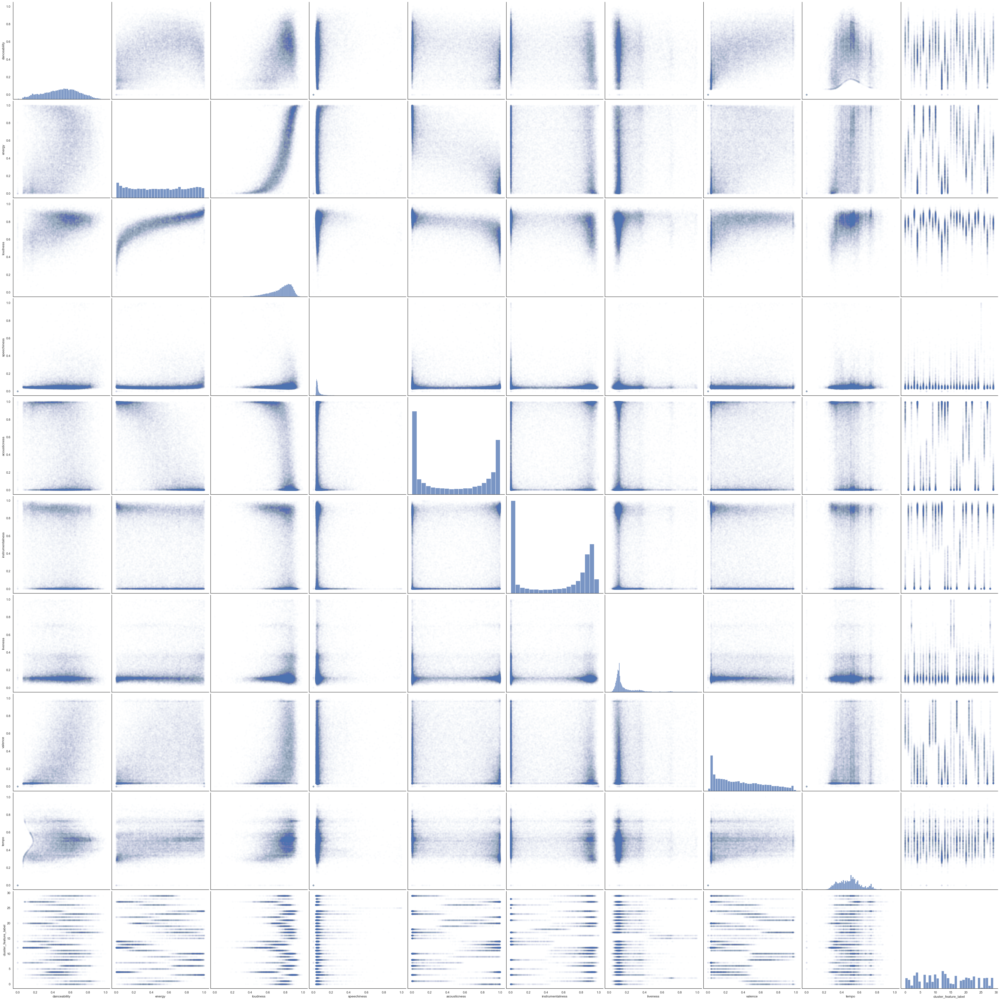

In [137]:
sns.pairplot(track_features,plot_kws={'alpha':0.01}, palette='rainbow', height=5)
# _ = pd.plotting.scatter_matrix(track_features, figsize=(24,24), alpha=0.01, color='black', hist_kwds={'color':['black']})

Then looking again at the TSNE...

In [49]:
tsne_2d = TSNE(perplexity=20, n_components=2, init='pca', n_iter=2**10, random_state=7, learning_rate='auto')
feature_tsne_2d = tsne_2d.fit_transform(track_features.values)

In [50]:
dfatn = df.groupby(['artistName', 'trackName']).size()
dfatn_counts = dfatn[track_features.index]
colors = dfatn_counts**3
colors = (colors/(colors.max()))
alphas = dfatn_counts**0.7
alphas = (alphas/(alphas.max()))

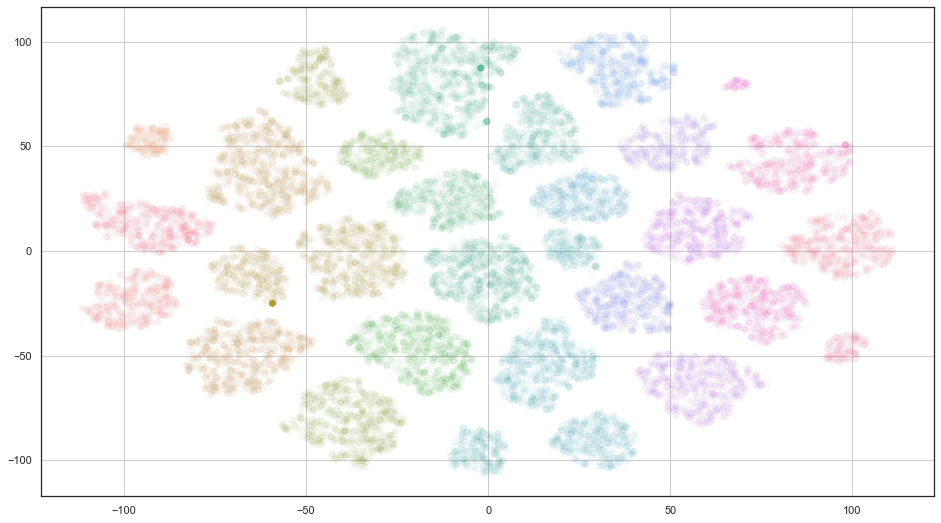

In [51]:
# Colour by value counts to highlight frequent genres
cmap = sns.color_palette('husl', as_cmap=True)
_ = tsne_plot_2d(feature_tsne_2d, track_features.loc, key_annotations=[], colors=track_features['cluster_feature_label'], alphas=alphas, cmap=cmap, annotate_size=13)

In [73]:
# In 3D - set `%matplotlib widget` for interactive vis.
tsne_wp_3d = TSNE(perplexity=20, n_components=3, init='pca', n_iter=2**8, random_state=7)
feature_tsne_3d = tsne_wp_3d.fit_transform(track_features.values)

In [289]:
dftc = df.groupby([pd.Grouper(freq='1w')]).cluster_label
# Need to extract datetime index here and reindex or it loses the freq property due to zero values for certain weeks
index_freq = dftc.size().index
tdf = dftc.apply(pd.value_counts).unstack().fillna(0).astype(int).reindex(index_freq)
# tdf.rolling('30d', center=True, min_periods=1).mean()['celtic/irish folk'].plot(alpha=0.4)

# Aggregate views

In [42]:
# Let's run the clustering again for a longer run
_genre2vec = Word2Vec(sentences=genres_collections, vector_size=16, window=18, min_count=1, workers=1, epochs=2**6)
_kmeans_genres = KMeans(n_clusters=30, n_init=100, max_iter=300).fit(_genre2vec.wv.vectors)
_tsne_2d = TSNE(perplexity=11, n_components=2, init='pca', n_iter=2**12, random_state=7, learning_rate='auto')
_genre_tsne_2d = _tsne_2d.fit_transform(_genre2vec.wv.vectors)

2024-12-11 13:24:05:INFO: collecting all words and their counts
2024-12-11 13:24:05:INFO: PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2024-12-11 13:24:05:INFO: PROGRESS: at sentence #10000, processed 33471 words, keeping 1287 word types
2024-12-11 13:24:05:INFO: PROGRESS: at sentence #20000, processed 67990 words, keeping 1856 word types
2024-12-11 13:24:05:INFO: PROGRESS: at sentence #30000, processed 98527 words, keeping 2346 word types
2024-12-11 13:24:05:INFO: PROGRESS: at sentence #40000, processed 124229 words, keeping 2785 word types
2024-12-11 13:24:05:INFO: collected 2833 word types from a corpus of 127397 raw words and 41377 sentences
2024-12-11 13:24:05:INFO: Creating a fresh vocabulary
2024-12-11 13:24:05:INFO: Word2Vec lifecycle event {'msg': 'effective_min_count=1 retains 2833 unique words (100.00% of original 2833, drops 0)', 'datetime': '2024-12-11T13:24:05.314242', 'gensim': '4.3.2', 'python': '3.11.3 (main, May 15 2023, 18:01:31) [Clang 14.0.6 ]'

In [189]:
df['cluster_embedding'] = df.genres.apply(lambda x: get_mean_embedding_from_genres(x, _genre2vec))
df['cluster'] = _kmeans_genres.predict(np.stack(df.cluster_embedding.to_numpy()))
cluster_labels = generate_cluster_labels(_kmeans_genres)
df['cluster_label'] = df.cluster.map(cluster_labels)

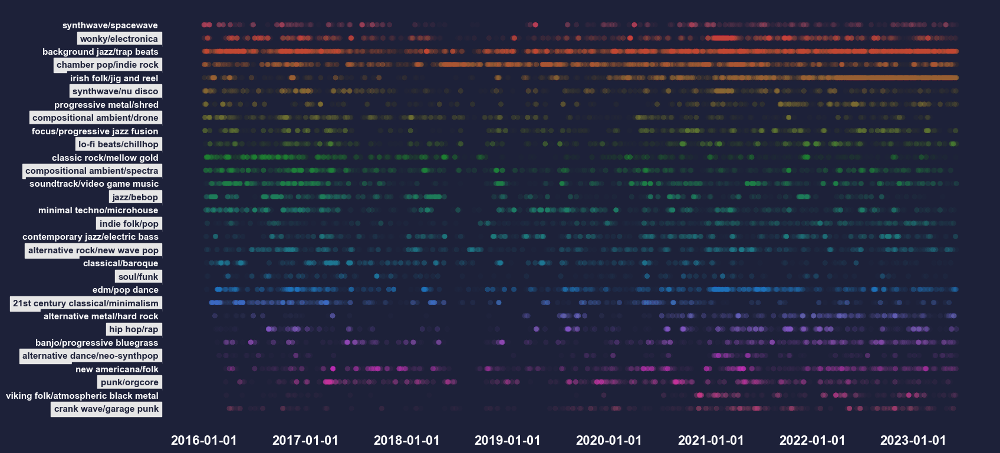

In [55]:
def spectral_plot(x, y, hue, height=8, aspect=2.2, alpha=0.05, background_color='#1d2139', palette='husl', filename=None):
    """Plot listen events as points.
    """
    fg = sns.relplot(x=x, y=y, hue=hue, edgecolor=None, height=height, aspect=aspect, alpha=alpha, palette=palette)
    fg.figure.set_facecolor(background_color)
    fg.ax.set_facecolor(background_color)
    fg.set(xlabel=None, ylabel=None)
    # Format alternating ticks to distinguish
    for i, t in enumerate(fg.ax.yaxis.get_ticklabels()):
        if i%2:
            t.set_fontweight('bold')
            t.set_backgroundcolor([0.9]*3)
            t.set_color(background_color)
        else:
            t.set_fontweight('bold')
            t.set_backgroundcolor(background_color)
            t.set_color('white')
    fg.set_xticklabels(color='white', weight='bold', fontsize=16)
    fg._legend.remove()
    fg.despine(bottom=True, left=True)
    if filename:
        plt.savefig(f'../output/{filename}')


# Genre cluster activity spectra - needs a low alpha value to account for the large number of scatter points overlapping
# The cluster 'trap beats/pianissimo' is a collection of arists with 0-2 genres and are therefore difficult to associate with other genres in the embedding stage.
spectral_plot(x=df.index, y=df.cluster_label, hue=df.cluster_label, height=8, aspect=2.2, alpha=0.02, filename='genre_cluster_spectral.png')

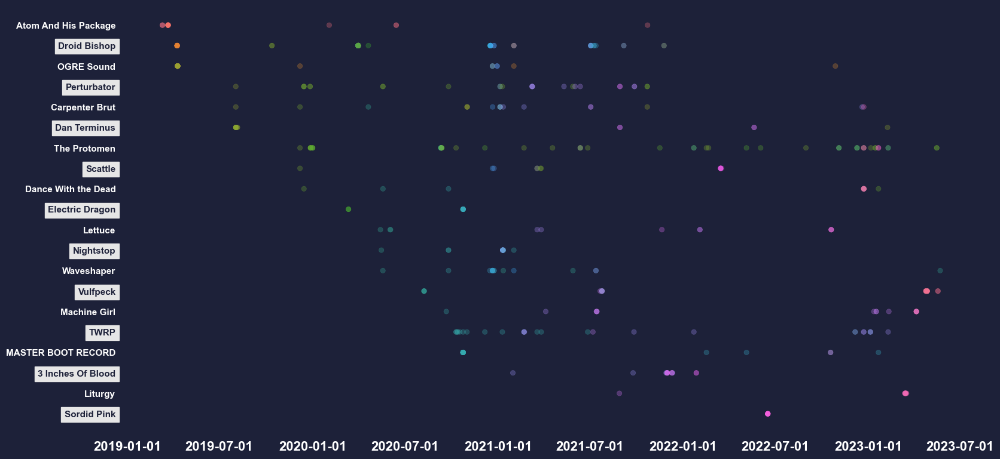

In [62]:
category = 'artistName'
label = 'synthwave/spacewave'
assert label in df.cluster_label.values
subset = (df.index.year >= 2019) & (df.cluster_label == label)
tdf = df[subset].copy()
tdf = tdf[tdf[category].isin(tdf[category].value_counts().index[0:20])]
spectral_plot(x=tdf.index, y=tdf[category], hue=tdf.trackName, palette='husl', alpha=0.3, height=8, aspect=2.2, filename='synthwave_top20_spectral.png')

In [ ]:
# tdf = df[df.index.year >= 2020]
# tdf = tdf[tdf.artistName.isin(tdf.artistName.value_counts()[0:30].index)]
# spectral_plot(x=tdf.index, y=tdf.artistName, hue=tdf.albumName, palette='husl')

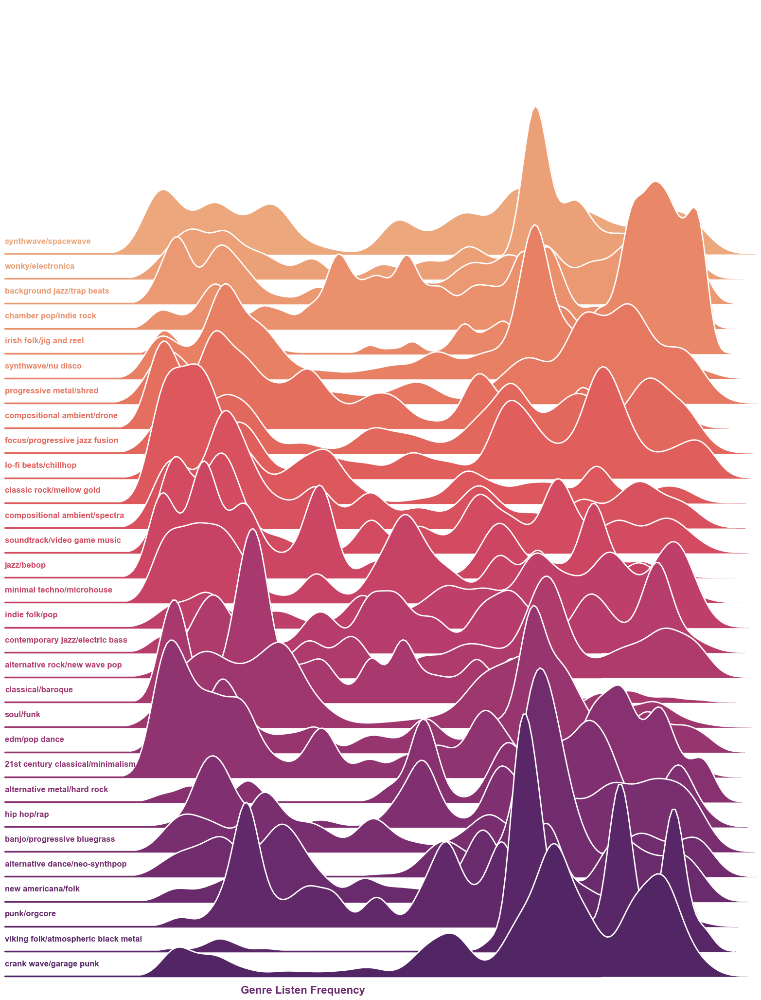

In [67]:
# Low count clusters will exagerate KDE plots
_ = df.cluster_label.value_counts()
populated_clusters = _[_ > 100].index

tdf = df[df.cluster_label.isin(populated_clusters)].copy()
tdf['year'] = tdf.index.year
tdf['date'] = tdf.index.round('1d')
# sns.kdeplot(x=tdf.popularity, hue=tdf.index.year, warn_singular=False)
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
y = 'cluster_label'
x = 'date'
p = sns.color_palette("husl", kmeans_genres.n_clusters, as_cmap=False)
xtl = ridge_plot(tdf, x, y, palette='flare', xlabel='Genre Listen Frequency',
                 xlim=(datetime.datetime(2014,6,1),datetime.datetime(2022,1,1)),bw_adjust=0.4,hspace=-0.9, label_text_y=0.05, filename='genre_ridge_plot.png')

In [290]:
# Low count clusters will exagerate KDE plots
_ = df.cluster_label.value_counts()
populated_clusters = _[_ > 100].index

tdf = df[df.cluster_label.isin(populated_clusters)].copy()
tdf['year'] = tdf.index.year
tdf['date'] = tdf.index.round('1d')
# sns.kdeplot(x=tdf.popularity, hue=tdf.index.year, warn_singular=False)
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
y = 'cluster_label'
x = 'date'
p = sns.color_palette("husl", kmeans_genres.n_clusters, as_cmap=False)
# tdf = pd.concat([row, tdf], ignore_index=False)

In [374]:
import matplotlib.patches as patches

def ridge_plot(tdf, x, y, title=None, xtick_labels:list = None, bw_adjust=0.4,hspace=-0.6,label_text_y=0.2, alpha=1, palette='flare',xlim=None, xlabel=None, clip=None, filename=None, figure_facecolor='white', pulsar=False):
    kde_shape_color = None
    kde_curve_color = 'white'
    linewidth=1.5
    if pulsar:
        sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
        figure_facecolor='black'
        kde_shape_color='black'
        kde_curve_color='white'
        linewidth=2.5
    # Initialize the FacetGrid object
    g = sns.FacetGrid(data=tdf, row=y, hue=y, aspect=24, height=0.7, palette=palette, xlim=xlim)
    g.figure.set_facecolor(figure_facecolor)

    # Draw the densities in a few steps
    g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=False, color=kde_shape_color, fill=True, alpha=alpha, linewidth=linewidth, clip=clip)
    g.map(sns.kdeplot, x, bw_adjust=bw_adjust, clip_on=False, color=kde_curve_color, lw=4, clip=clip)
    if not pulsar:
        g.refline(y=0, linewidth=2.5, linestyle="-", color=kde_shape_color, clip_on=False)  # passing color=None to refline() uses the hue mapping

    # Store pulsar theme in kwargs dict - if not enabled, we should use the default
    kwargs = {'backgroundcolor':'white'} if pulsar else {}
    # Define and use a simple function to label the plot in axes coordinates
    def label(x, color, label):
        ax = plt.gca()
        if pulsar:
            color='black'
        ax.text(0, label_text_y, label, fontsize=20, fontweight="bold", color=color, ha="right", va="center", transform=ax.transAxes, **kwargs)

    g.map(label, y)
    g.figure.subplots_adjust(hspace=hspace)  # Set the subplots to overlap
    # Remove axes details that don't play well with overlap
    g.set_titles('')
    g.set(yticks=[], ylabel="")
    last_color = 'white' if pulsar else sns.color_palette("flare", as_cmap=False)[-1]
    g.set_xticklabels(xtick_labels, weight='bold', fontsize=24, color=last_color) # setting these params disrupts the default xticklabel range - not sure how to fix
    g.set_xlabels(xlabel, weight='bold', fontsize=40, color=last_color)
    bbox_inches='tight'
    g.despine(bottom=True, left=True)
    if title:
        # This might need a lot of fine tuning... only worth it if we want the title behind
        # the plots.
        # Define the coordinates for the title and rectangle
        title_y = 0.8
        rect_y = title_y - 0.05  # Adjust the rectangle's y-coordinate to align with the title
        # Add a rectangle for the background
        # g.fig.patches.extend([patches.Rectangle((0, rect_y), 1, 0.1, transform=g.fig.transFigure, color='white', zorder=-1, clip_on=False)])
        plt.suptitle(title, fontsize=140, fontname='Verdana', fontweight='bold', color='white', va='center', ha='center', y=title_y)
        # Adjust layout to ensure the rectangle spans the full width
        plt.subplots_adjust(top=0.9)
    if filename:
        plt.savefig(f'../output/{filename}')
    sns.set_theme(style="white")  # Set theme back for later plots

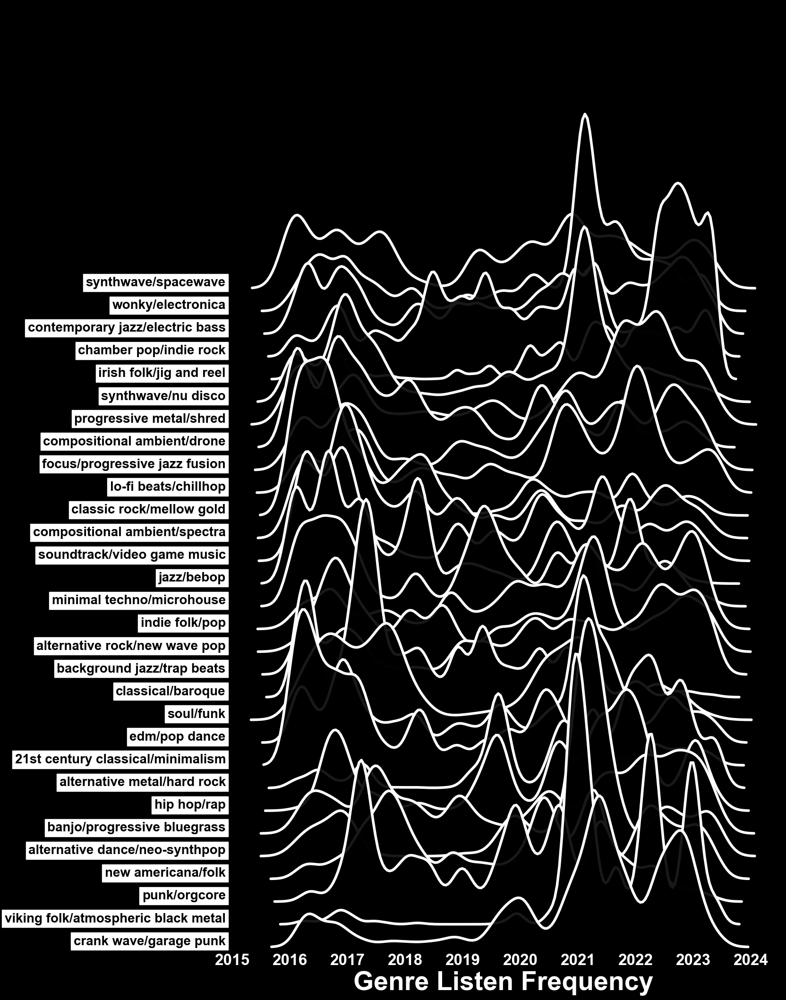

In [377]:
ridge_plot(tdf, x, y, bw_adjust=0.4,hspace=-.92,label_text_y=0.02,
           xtick_labels=[2015,2016,2017,2018,2019,2020,2021,2022,2023,2024],
        #    xlim=(datetime.datetime(2015,1,1),datetime.datetime(2022,1,1)),
           xlabel='Genre Listen Frequency', pulsar=True, alpha=0.9, filename='genre_ridge_plot_pulsar.png')